# Assignment 2

## Imports

In [1]:
import math
import os
import time
from typing import Literal

import cv2
import matplotlib.pyplot as plt
import numpy as np
import numpy.typing as npt
from matplotlib.axes import Axes
from scipy.stats import norm
from skimage.morphology import skeletonize

## Constants

In [2]:
PROJECT_DIR = '..'
IMAGES_DIR = os.path.join(PROJECT_DIR, 'images')
OUTPUT_DIR = os.path.join(PROJECT_DIR, 'output')
PLOTS_DIR = os.path.join(PROJECT_DIR, 'plots')

## Helper Functions

In [3]:
def read_image(src_path: str, color_space: Literal['rgb', 'gray'] = 'rgb') -> npt.NDArray[np.uint8]:
    """ Reads an image into an array, given the absolute path. """

    if color_space == 'rgb':
        image = cv2.imread(src_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    elif color_space == 'gray':
        image = cv2.imread(src_path, 0)
    else:
        raise ValueError(f'Unrecognised color space argument {color_space}')
    return image

In [4]:
def write_image(dest_path: str, image: npt.NDArray[np.uint8]) -> None:
    """ Writes an array as an image file, given the absolute path. """

    if image.ndim == 3:
        image_bgr = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
        cv2.imwrite(dest_path, image_bgr)
    else:
        cv2.imwrite(dest_path, image)

In [5]:
def display_image(image: npt.NDArray[np.uint8], title: str = '', ax: Axes = None) -> None:
    """ Displays the image represented by an array. """

    if ax is None:
        if image.ndim == 3:
            plt.imshow(image)
        else:
            plt.imshow(image, cmap='gray')
        plt.title(title)
        plt.axis('off')
        plt.show()

    else:
        if image.ndim == 3:
            ax.imshow(image)
        else:
            ax.imshow(image, cmap='gray')
        ax.set_title(title)
        ax.axis('off')

In [6]:
def save_plot(dest_path: str) -> None:
    """ Saves the plot as an image file, given the absolute path. """

    plt.savefig(dest_path, bbox_inches='tight')

## Questions

### 1. Let's Get Blurry

In [7]:
def conv2D(img: npt.NDArray[np.uint8], kernel: npt.NDArray[np.float64]) -> npt.NDArray[np.uint8]:
    """ Convolves a 2D image with a 2D kernel of size k x k. """

    # Image and kernel dimensions
    i_h, i_w = img.shape[:2]
    k_h, k_w = kernel.shape
    output = np.empty_like(img)

    # Flip the kernel
    kernel = np.flipud(np.fliplr(kernel))

    # Number of values padded to the edges of each axis
    p0 = (math.ceil((k_h - 1) / 2), math.floor((k_h - 1) / 2))
    p1 = (math.ceil((k_w - 1) / 2), math.floor((k_w - 1) / 2))
    p2 = (0, 0)

    # Apply padding to the image
    if img.ndim == 2:
        img = np.pad(img, (p0, p1), mode='reflect')
    elif img.ndim == 3:
        img = np.pad(img, (p0, p1, p2), mode='reflect')
    else:
        raise

    # Perform convolution
    if img.ndim == 2:
        for idx in range(i_h):
            for jdx in range(i_w):
                output[idx, jdx] = np.sum(img[idx:idx+k_h, jdx:jdx+k_w] * kernel)
    else:
        for kdx in range(img.shape[2]):
            for idx in range(i_h):
                for jdx in range(i_w):
                    output[idx, jdx, kdx] = np.sum(img[idx:idx+k_h, jdx:jdx+k_w, kdx] * kernel)

    return output

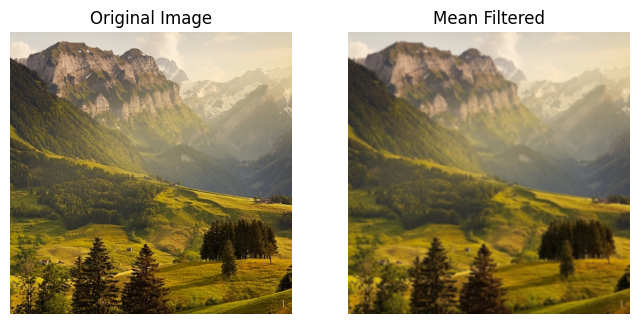

In [8]:
def meanFilter(img: npt.NDArray[np.uint8], k: int = 5) -> npt.NDArray[np.uint8]:
    """ Applies a Mean Filter to a 2D image using a kernel of size k. """

    return conv2D(img, np.full((k, k), k ** -2))

img1 = read_image(f'{IMAGES_DIR}/IMG1.jpg')
img1_filtered = meanFilter(img1)
assert img1.shape == img1_filtered.shape
write_image(f'{OUTPUT_DIR}/IMG1_mean.png', img1_filtered)

fig, axs = plt.subplots(1, 2, figsize=(8, 4))
display_image(img1, 'Original Image', axs[0])
display_image(img1_filtered, 'Mean Filtered', axs[1])
save_plot(f'{PLOTS_DIR}/meanFilter.png')

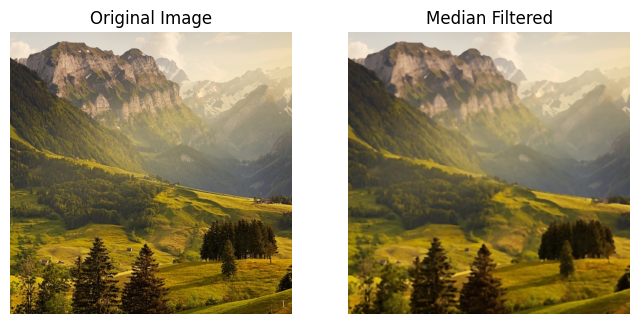

In [9]:
def medianFilter(img: npt.NDArray[np.uint8], k: int = 5) -> npt.NDArray[np.uint8]:
    """ Applies a Median Filter to a 2D image using a 2D window of size k. """

    # Image and kernel dimensions
    i_h, i_w = img.shape[:2]
    output = np.empty_like(img)

    # Number of values padded to the edges of each axis
    p0 = p1 = (math.ceil((k - 1) / 2), math.floor((k - 1) / 2))
    p2 = (0, 0)

    # Apply padding to the image
    if img.ndim == 2:
        img = np.pad(img, (p0, p1), mode='reflect')
    elif img.ndim == 3:
        img = np.pad(img, (p0, p1, p2), mode='reflect')
    else:
        raise

    # Apply the filter
    if img.ndim == 2:
        for idx in range(i_h):
            for jdx in range(i_w):
                output[idx, jdx] = np.median(img[idx:idx + k, jdx:jdx + k])
    else:
        for kdx in range(img.shape[2]):
            for idx in range(i_h):
                for jdx in range(i_w):
                    output[idx, jdx, kdx] = np.median(img[idx:idx + k, jdx:jdx + k, kdx])

    return output

img1 = read_image(f'{IMAGES_DIR}/IMG1.jpg')
img1_filtered = medianFilter(img1)
assert img1.shape == img1_filtered.shape
write_image(f'{OUTPUT_DIR}/IMG1_median.png', img1_filtered)

fig, axs = plt.subplots(1, 2, figsize=(8, 4))
display_image(img1, 'Original Image', axs[0])
display_image(img1_filtered, 'Median Filtered', axs[1])
save_plot(f'{PLOTS_DIR}/medianFilter.png')

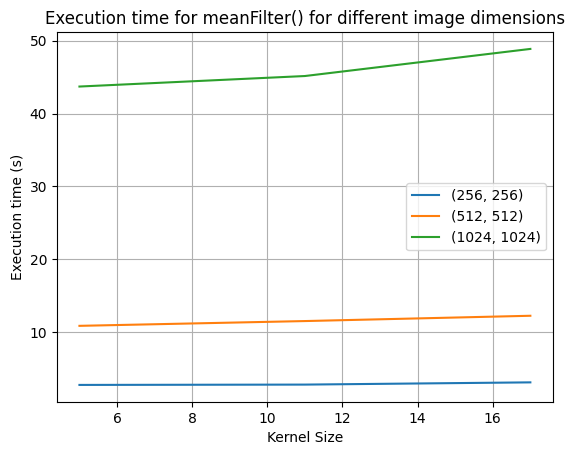

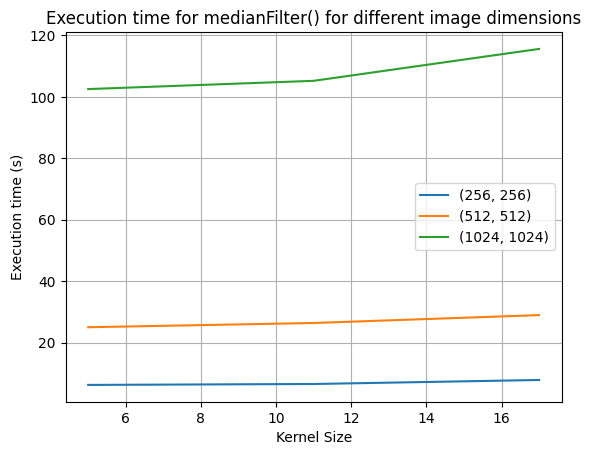

In [10]:
# Test cases
image_dimensions = [
    (256, 256),
    (512, 512),
    (1024, 1024)
]
kernel_sizes = [5, 11, 17]

# Execution times for each test case
mean_filter_times = [ [] for _ in image_dimensions ]
median_filter_times = [ [] for _ in image_dimensions ]

# Iterate over test cases
for idx, img_dim in enumerate(image_dimensions):
    for k in kernel_sizes:

        # Read and resize the image to test dimension
        img1 = read_image(f'{IMAGES_DIR}/IMG1.jpg')
        img1 = cv2.resize(img1, img_dim)

        # Time for mean filtering
        start_time = time.time()
        meanFilter(img1, k)
        end_time = time.time()
        mean_filter_times[idx].append(end_time - start_time)

        # Time for median filtering
        start_time = time.time()
        medianFilter(img1, k)
        end_time = time.time()
        median_filter_times[idx].append(end_time - start_time)

for idx, img_dim in enumerate(image_dimensions):
    plt.plot(kernel_sizes, mean_filter_times[idx], label=f'{img_dim}')
plt.title('Execution time for meanFilter() for different image dimensions')
plt.ylabel('Execution time (s)')
plt.xlabel('Kernel Size')
plt.legend()
plt.grid()
save_plot(f'{PLOTS_DIR}/meanFilter_exec_time.png')
plt.show()

for idx, img_dim in enumerate(image_dimensions):
    plt.plot(kernel_sizes, median_filter_times[idx], label=f'{img_dim}')
plt.title('Execution time for medianFilter() for different image dimensions')
plt.ylabel('Execution time (s)')
plt.xlabel('Kernel Size')
plt.legend()
plt.grid()
save_plot(f'{PLOTS_DIR}/medianFilter_exec_time.png')
plt.show()

**Observations:**

- The execution time is proportional to the image and kernel size.

- The median filter takes longer time, presumably due to costlier sorting/selection operations.

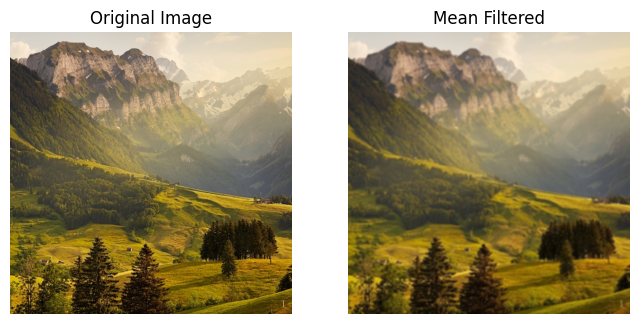

In [11]:
def fastMeanFilter(img: npt.NDArray[np.uint8], k: int = 5) -> npt.NDArray[np.uint8]:
    """ Applies a Mean Filter to a 2D image using a kernel of size k, with operation speedup. """

    # Image and kernel dimensions
    i_h, i_w = img.shape[:2]
    output = np.empty_like(img)

    # Number of values padded to the edges of each axis
    p0 = (math.ceil((k - 1) / 2), math.floor((k - 1) / 2))
    p1 = (math.ceil((k - 1) / 2), math.floor((k - 1) / 2))
    p2 = (0, 0)

    # Apply padding to the image
    if img.ndim == 2:
        img = np.pad(img, (p0, p1), mode='reflect')
    elif img.ndim == 3:
        img = np.pad(img, (p0, p1, p2), mode='reflect')
    else:
        raise

    # Perform convolution
    if img.ndim == 2:
        col_zeros = np.zeros((img.shape[0], 1), dtype=np.float32)
        row_zeros = np.zeros((1, img.shape[1] + 1), dtype=np.float32)
        cumsum = np.hstack((col_zeros, np.cumsum(img, axis=1, dtype=np.float32)))
        cumsum = np.vstack((row_zeros, np.cumsum(cumsum, axis=0, dtype=np.float32)))
        for idx in range(i_h):
            for jdx in range(i_w):
                output[idx, jdx] = (cumsum[idx+k, jdx+k] + cumsum[idx, jdx] - cumsum[idx+k, jdx] - cumsum[idx, jdx+k]) / k**2
    else:
        col_zeros = np.zeros((img.shape[0], 1), dtype=np.float32)
        row_zeros = np.zeros((1, img.shape[1] + 1), dtype=np.float32)
        for kdx in range(img.shape[2]):
            cumsum = np.hstack((col_zeros, np.cumsum(img[:, :, kdx], axis=1, dtype=np.float32)))
            cumsum = np.vstack((row_zeros, np.cumsum(cumsum, axis=0, dtype=np.float32)))
            for idx in range(i_h):
                for jdx in range(i_w):
                    output[idx, jdx, kdx] = (cumsum[idx+k, jdx+k] + cumsum[idx, jdx] - cumsum[idx+k, jdx] - cumsum[idx, jdx+k]) / k**2

    return output

img1 = read_image(f'{IMAGES_DIR}/IMG1.jpg')
img1_filtered = fastMeanFilter(img1)
assert img1.shape == img1_filtered.shape
write_image(f'{OUTPUT_DIR}/IMG1_fast_mean.png', img1_filtered)

fig, axs = plt.subplots(1, 2, figsize=(8, 4))
display_image(img1, 'Original Image', axs[0])
display_image(img1_filtered, 'Mean Filtered', axs[1])
save_plot(f'{PLOTS_DIR}/fastMeanFilter.png')

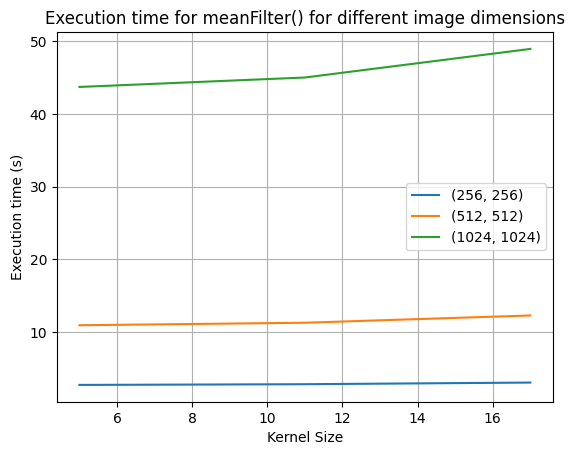

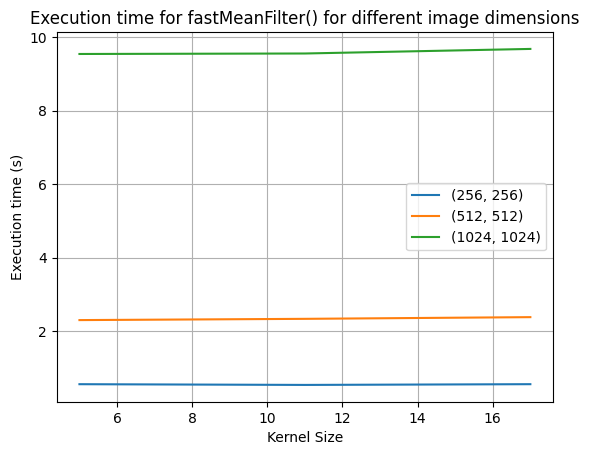

In [12]:
# Test cases
image_dimensions = [
    (256, 256),
    (512, 512),
    (1024, 1024)
]
kernel_sizes = [5, 11, 17]

# Execution times for each test case
mean_filter_times = [ [] for _ in image_dimensions ]
fast_mean_filter_times = [ [] for _ in image_dimensions ]

# Iterate over test cases
for idx, img_dim in enumerate(image_dimensions):
    for k in kernel_sizes:

        # Read and resize the image to test dimension
        img1 = read_image(f'{IMAGES_DIR}/IMG1.jpg')
        img1 = cv2.resize(img1, img_dim)

        # Time for mean filtering
        start_time = time.time()
        meanFilter(img1, k)
        end_time = time.time()
        mean_filter_times[idx].append(end_time - start_time)

        # Time for median filtering
        start_time = time.time()
        fastMeanFilter(img1, k)
        end_time = time.time()
        fast_mean_filter_times[idx].append(end_time - start_time)

for idx, img_dim in enumerate(image_dimensions):
    plt.plot(kernel_sizes, mean_filter_times[idx], label=f'{img_dim}')
plt.title('Execution time for meanFilter() for different image dimensions')
plt.ylabel('Execution time (s)')
plt.xlabel('Kernel Size')
plt.legend()
plt.grid()
save_plot(f'{PLOTS_DIR}/meanFilter_exec_time.png')
plt.show()

for idx, img_dim in enumerate(image_dimensions):
    plt.plot(kernel_sizes, fast_mean_filter_times[idx], label=f'{img_dim}')
plt.title('Execution time for fastMeanFilter() for different image dimensions')
plt.ylabel('Execution time (s)')
plt.xlabel('Kernel Size')
plt.legend()
plt.grid()
save_plot(f'{PLOTS_DIR}/fastMeanFilter_exec_time.png')
plt.show()

**Observations:**

- The execution time is still proportional to the image size, but the growth with kernel size is negligible for the fast mean filter.

### 2. Distribution is the Solution

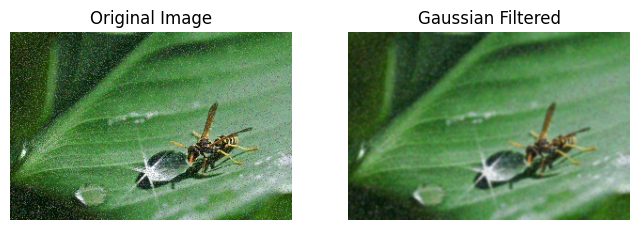

In [13]:
def gaussFilter(img: npt.NDArray[np.uint8], k: int = 7, sigma: float = 1.15) -> npt.NDArray[np.uint8]:
    """ Applies a Gaussian Filter to a 2D image using a kernel of size k and standard deviation sigma. """

    # Generate the indices for the kernel size
    u_min = -math.ceil((k - 1) / 2)
    u_max = math.floor((k - 1) / 2)
    x, y = np.mgrid[u_min:u_max+1, u_min:u_max+1]

    # Compute the Gaussian kernel
    kernel = np.exp(-(x**2 + y**2) / (2 * sigma**2))
    kernel /= np.sum(kernel)

    return conv2D(img, kernel)

img2 = read_image(f'{IMAGES_DIR}/IMG2.jpg')
img2_filtered = gaussFilter(img2, sigma=1)
assert img2.shape == img2_filtered.shape
write_image(f'{OUTPUT_DIR}/IMG2_gaussian.png', img2_filtered)

fig, axs = plt.subplots(1, 2, figsize=(8, 4))
display_image(img2, 'Original Image', axs[0])
display_image(img2_filtered, 'Gaussian Filtered', axs[1])
save_plot(f'{PLOTS_DIR}/gaussFilter.png')

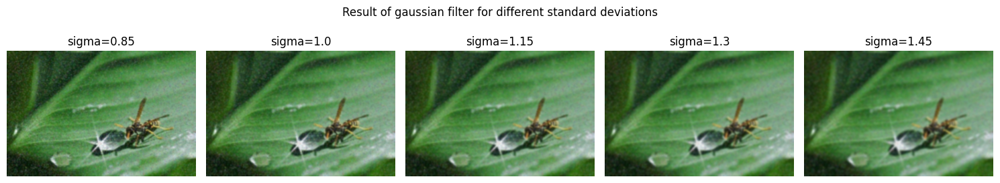

In [14]:
# Read the image
img2 = read_image(f'{IMAGES_DIR}/IMG2.jpg')

# Test cases
list_sigma = [0.85, 1.0, 1.15, 1.3, 1.45]

# Filtered images for each test case
filtered_images = []

# Iterate over test cases
for sigma in list_sigma:
    img2_filtered = gaussFilter(img2, sigma=sigma)
    # write_image(f'{OUTPUT_DIR}/IMG2_gaussian_7_{sigma}.png', img2_filtered)
    filtered_images.append(img2_filtered)

# Plot the images
fig, axs = plt.subplots(1, len(list_sigma), figsize=(15, 3))
fig.suptitle('Result of gaussian filter for different standard deviations')
for idx, sigma in enumerate(list_sigma):
    display_image(filtered_images[idx], f'sigma={list_sigma[idx]}', axs[idx])
plt.tight_layout()

save_plot(f'{PLOTS_DIR}/gaussFilter_standard_deviation.png')

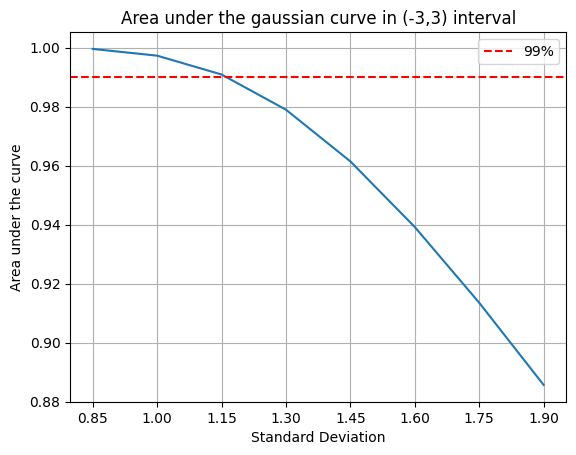

In [15]:
# Test range
k = 7
u_min = -math.ceil((k - 1) / 2)
u_max = math.floor((k - 1) / 2)

# Standard deviation
list_sigma = np.arange(0.85, 2.05, 0.15)
list_area = []

# Compute area under curve
for sigma in list_sigma:
    area = norm.cdf(u_max, loc=0, scale=sigma) - norm.cdf(u_min, loc=0, scale=sigma)
    list_area.append(area)

# Plot area under curve
plt.plot(list_sigma, list_area)
plt.axhline(y=0.99, color='r', linestyle='--', label='99%')
plt.xticks(list_sigma)
plt.title(f'Area under the gaussian curve in ({u_min},{u_max}) interval')
plt.ylabel('Area under the curve')
plt.xlabel('Standard Deviation')
plt.legend()
plt.grid()
save_plot(f'{PLOTS_DIR}/gaussFilter_area_under_curve_{k}.png')

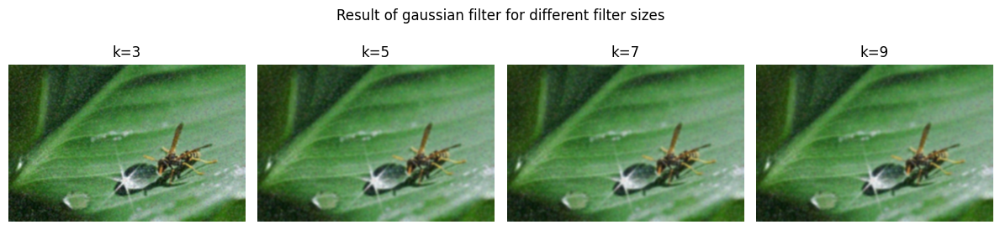

In [16]:
# Read the image
img2 = read_image(f'{IMAGES_DIR}/IMG2.jpg')

# Test cases
list_k = [3, 5, 7, 9]
sigma_optimal = 1.15

# Filtered images for each test case
filtered_images = []

# Iterate over test cases
for k in list_k:
    img2_filtered = gaussFilter(img2, k=k, sigma=sigma_optimal)
    # write_image(f'{OUTPUT_DIR}/IMG2_gaussian_{k}_{sigma_optimal}.png', img2_filtered)
    filtered_images.append(img2_filtered)

# Plot the images
fig, axs = plt.subplots(1, len(list_k), figsize=(12, 3))
fig.suptitle('Result of gaussian filter for different filter sizes')
for idx, sigma in enumerate(list_k):
    display_image(filtered_images[idx], f'k={list_k[idx]}', axs[idx])
plt.tight_layout()

save_plot(f'{PLOTS_DIR}/gaussFilter_filter_size.png')

**Observations:**

- With increase in standard deviation, the smoothening effect increases, with higher weights assigned to pixels away from the center. This however saturates after the distribution becomes almost flat in the region of interest, i.e. $[\frac{k-1}{2}, \frac{k-1}{2}]$.

- With increase in k, the smoothening effect increases, as the neighbourhood being averaged over expands.

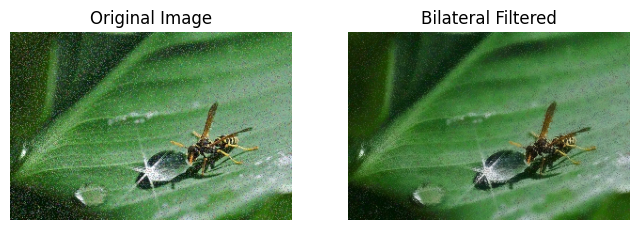

In [17]:
def bilateralFilter(
    img: npt.NDArray[np.uint8], k: int = 7, sigma_spatial: float = 10.0, sigma_range: float = 75.0
)-> npt.NDArray[np.uint8]:
    """ Applies a Bilateral Filter to a 2D image using a kernel of size k and standard deviations
    sigma_spatial and sigma_range for domain and range kernels. """

    # Generate the indices for the kernel size
    u_min = -math.ceil((k - 1) / 2)
    u_max = math.floor((k - 1) / 2)
    x, y = np.mgrid[u_min:u_max+1, u_min:u_max+1]

    # Compute the kernel
    domain_kernel = np.exp(-(x**2 + y**2) / (2 * sigma_spatial**2))

    # Image and kernel dimensions
    i_h, i_w = img.shape[:2]
    output = np.empty_like(img)

    # Number of values padded to the edges of each axis
    p0 = p1 = (math.ceil((k - 1) / 2), math.floor((k - 1) / 2))
    p2 = (0, 0)

    # Apply padding to the image
    if img.ndim == 2:
        img = np.pad(img, (p0, p1), mode='reflect')
    elif img.ndim == 3:
        img = np.pad(img, (p0, p1, p2), mode='reflect')
    else:
        raise

    # Perform convolution
    if img.ndim == 2:
        for idx in range(i_h):
            for jdx in range(i_w):
                delta_intensity = - (img[idx-u_min, jdx-u_min] - img[idx:idx+k, jdx:jdx+k]) ** 2
                range_kernel = np.exp(delta_intensity / (2 * sigma_range**2))
                kernel = domain_kernel * range_kernel
                kernel /= np.sum(kernel)
                output[idx, jdx] = np.sum(img[idx:idx+k, jdx:jdx+k] * kernel)
    else:
        for kdx in range(img.shape[2]):
            for idx in range(i_h):
                for jdx in range(i_w):
                    delta_intensity = np.linalg.norm(img[idx-u_min, jdx-u_min] - img[idx:idx+k, jdx:jdx+k], axis=2)
                    range_kernel = np.exp(-(delta_intensity**2) / (2 * sigma_range**2))
                    kernel = domain_kernel * range_kernel
                    kernel /= np.sum(kernel)
                    output[idx, jdx, kdx] = np.sum(img[idx:idx+k, jdx:jdx+k, kdx] * kernel)

    return output

img2 = read_image(f'{IMAGES_DIR}/IMG2.jpg')
img2_filtered = bilateralFilter(img2)
assert img2.shape == img2_filtered.shape
write_image(f'{OUTPUT_DIR}/IMG2_bilateral.png', img2_filtered)

fig, axs = plt.subplots(1, 2, figsize=(8, 4))
display_image(img2, 'Original Image', axs[0])
display_image(img2_filtered, 'Bilateral Filtered', axs[1])
save_plot(f'{PLOTS_DIR}/bilateralFilter.png')

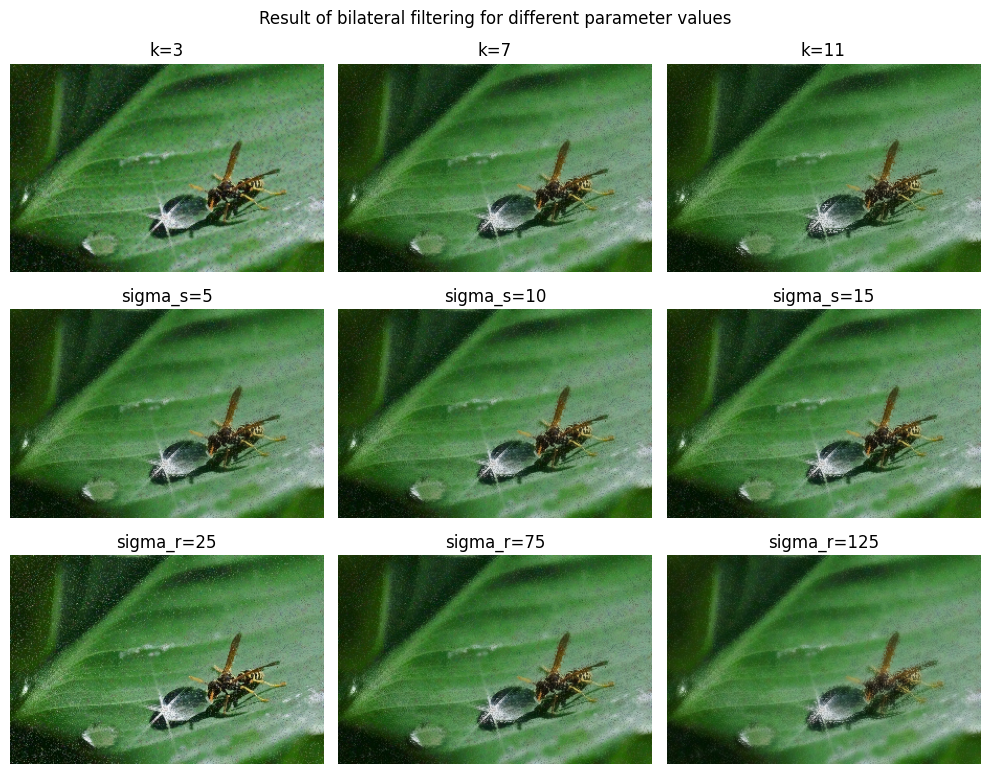

In [18]:
# Read the image
img2 = read_image(f'{IMAGES_DIR}/IMG2.jpg')

# Default parameter values
default_k = 7
default_sigma_spatial = 10.0
default_sigma_range = 75.0

# Test cases
list_k = [3, 7, 11]
list_sigma_spatial = [5, 10, 15]
list_sigma_range = [25, 75, 125]
assert len(list_k) == len(list_sigma_spatial) == len(list_sigma_range)

# Filtered images for each test case
filtered_images = [ [] for _ in range(3) ]

# Iterate over test cases
for k in list_k:
    img2_filtered = bilateralFilter(img2, k=k)
    # write_image(f'{OUTPUT_DIR}/IMG2_bilateral_{k}_{default_sigma_spatial}_{default_sigma_range}.png', img2_filtered)
    filtered_images[0].append(img2_filtered)

for sigma_spatial in list_sigma_spatial:
    img2_filtered = bilateralFilter(img2, sigma_spatial=sigma_spatial)
    # write_image(f'{OUTPUT_DIR}/IMG2_bilateral_{default_k}_{sigma_spatial}_{default_sigma_range}.png', img2_filtered)
    filtered_images[1].append(img2_filtered)

for sigma_range in list_sigma_range:
    img2_filtered = bilateralFilter(img2, sigma_range=sigma_range)
    # write_image(f'{OUTPUT_DIR}/IMG2_bilateral_{default_k}_{default_sigma_spatial}_{sigma_range}.png', img2_filtered)
    filtered_images[2].append(img2_filtered)

# Plot the images
fig, axs = plt.subplots(3, len(list_k), figsize=(10, 8))
fig.suptitle('Result of bilateral filtering for different parameter values')

for idx, k in enumerate(list_k):
    display_image(filtered_images[0][idx], f'k={list_k[idx]}', axs[0][idx])
for idx, k in enumerate(list_sigma_spatial):
    display_image(filtered_images[1][idx], f'sigma_s={list_sigma_spatial[idx]}', axs[1][idx])
for idx, k in enumerate(list_sigma_range):
    display_image(filtered_images[2][idx], f'sigma_r={list_sigma_range[idx]}', axs[2][idx])

plt.tight_layout()
save_plot(f'{PLOTS_DIR}/bilateralFilter_parameter_variation.png')

**Observations:**

- With increase in k, the smoothening effect increases, as the neighbourhood being averaged over expands.

- With increase in spatial standard deviation, we move more and more away from the typical Gaussian blurring.

- With increase in range standard deviation, the change in intensities is smoothened out more, resulting in a cartoonish image for extreme values.

**Key Difference:**

- The gaussian filter does not differentiate between neighbours based on pixel color/intensity. The bilateral filter, on the other hand, tends to downweight the importance given to neighbours with significant change (w.r.t. range standard deviation) in the same.

- This is reflected in the object boundaries and intricacies of the objects being preserved in bilateral filtering, and not so in the case of gaussian filtering.

### 3. Edge of Glory

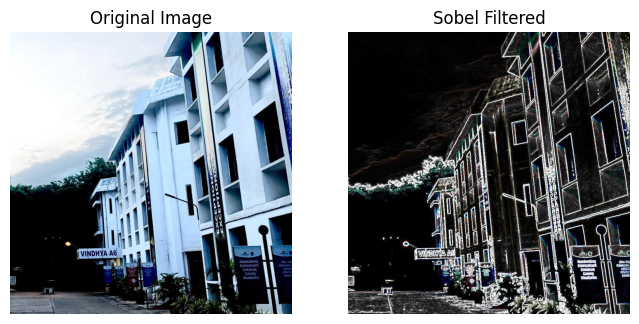

In [19]:
def sobelFilter(img: npt.NDArray[np.uint8]) -> npt.NDArray[np.uint8]:
    """ Applies the Sobel Filter to a 2D image. """

    # Sobel Filter
    S_x = np.array([
        [-1,  0, +1],
        [-2,  0, +2],
        [-1,  0, +1],
    ])
    S_y = np.array([
        [+1, +2, +1],
        [ 0,  0,  0],
        [-1, -2, -1],
    ])

    # Compute the gradients
    grad_X = conv2D(img.astype(np.int32), S_x) 
    grad_Y = conv2D(img.astype(np.int32), S_y)
    grad = np.hypot(grad_X, grad_Y)

    # Cast back to unsigned int
    grad_X = np.clip(grad_X + 127, 0, 255).astype(np.uint8)
    grad_Y = np.clip(grad_Y + 127, 0, 255).astype(np.uint8)
    grad = np.clip(grad, 0, 255).astype(np.uint8)

    return grad, grad_X, grad_Y

img3 = read_image(f'{IMAGES_DIR}/IMG3.jpeg')
img3_filtered, img3_filtered_X, img3_filtered_Y = sobelFilter(img3)
assert img3.shape == img3_filtered.shape == img3_filtered_X.shape == img3_filtered_Y.shape

write_image(f'{OUTPUT_DIR}/IMG3_sobel.png', img3_filtered)
write_image(f'{OUTPUT_DIR}/IMG3_sobel_X.png', img3_filtered_X)
write_image(f'{OUTPUT_DIR}/IMG3_sobel_Y.png', img3_filtered_Y)

fig, axs = plt.subplots(1, 2, figsize=(8, 4))
display_image(img3, 'Original Image', axs[0])
display_image(img3_filtered, 'Sobel Filtered', axs[1])
save_plot(f'{PLOTS_DIR}/sobelFilter.png')

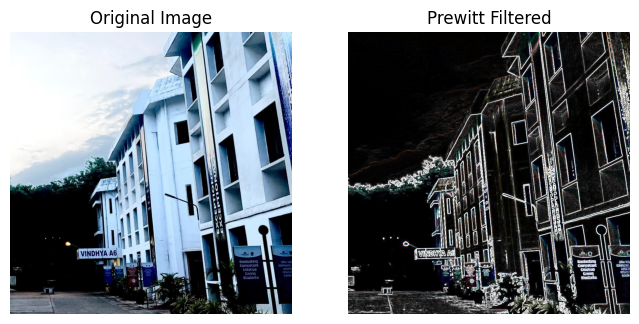

In [20]:
def prewittFilter(img: npt.NDArray[np.uint8]) -> npt.NDArray[np.uint8]:
    """ Applies the Prewitt Filter to a 2D image. """

    # Prewitt Filter
    S_x = np.array([
        [-1,  0, +1],
        [-1,  0, +1],
        [-1,  0, +1],
    ])
    S_y = np.array([
        [+1, +1, +1],
        [ 0,  0,  0],
        [-1, -1, -1],
    ])

    # Compute the gradients
    grad_X = conv2D(img.astype(np.int32), S_x) 
    grad_Y = conv2D(img.astype(np.int32), S_y)
    grad = np.hypot(grad_X, grad_Y)

    # Cast back to unsigned int
    grad_X = np.clip(grad_X + 127, 0, 255).astype(np.uint8)
    grad_Y = np.clip(grad_Y + 127, 0, 255).astype(np.uint8)
    grad = np.clip(grad, 0, 255).astype(np.uint8)

    return grad, grad_X, grad_Y

img3 = read_image(f'{IMAGES_DIR}/IMG3.jpeg')
img3_filtered, img3_filtered_X, img3_filtered_Y = prewittFilter(img3)
assert img3.shape == img3_filtered.shape == img3_filtered_X.shape == img3_filtered_Y.shape

write_image(f'{OUTPUT_DIR}/IMG3_prewitt.png', img3_filtered)
write_image(f'{OUTPUT_DIR}/IMG3_prewitt_X.png', img3_filtered_X)
write_image(f'{OUTPUT_DIR}/IMG3_prewitt_Y.png', img3_filtered_Y)

fig, axs = plt.subplots(1, 2, figsize=(8, 4))
display_image(img3, 'Original Image', axs[0])
display_image(img3_filtered, 'Prewitt Filtered', axs[1])
save_plot(f'{PLOTS_DIR}/prewittFilter.png')

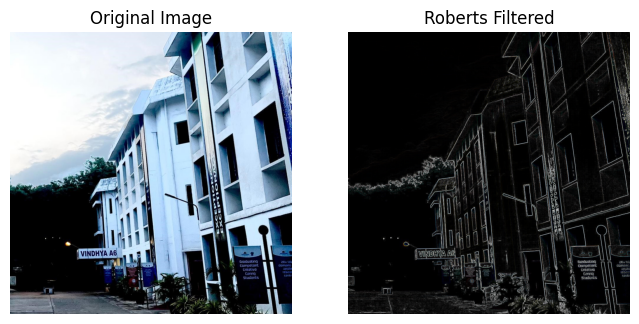

In [21]:
def robertsFilter(img: npt.NDArray[np.uint8]) -> npt.NDArray[np.uint8]:
    """ Applies the Roberts Cross Operators to a 2D image. """

    # Sobel Filter
    S_x = np.array([
        [+1,  0],
        [ 0, -1]
    ])
    S_y = np.array([
        [ 0, +1],
        [-1,  0],
    ])

    # Compute the gradients
    grad_X = conv2D(img.astype(np.int32), S_x) 
    grad_Y = conv2D(img.astype(np.int32), S_y)
    grad = np.hypot(grad_X, grad_Y)

    # Cast back to unsigned int
    grad_X = np.clip(grad_X + 127, 0, 255).astype(np.uint8)
    grad_Y = np.clip(grad_Y + 127, 0, 255).astype(np.uint8)
    grad = np.clip(grad, 0, 255).astype(np.uint8)

    return grad, grad_X, grad_Y

img3 = read_image(f'{IMAGES_DIR}/IMG3.jpeg')
img3_filtered, img3_filtered_X, img3_filtered_Y = robertsFilter(img3)
assert img3.shape == img3_filtered.shape == img3_filtered_X.shape == img3_filtered_Y.shape

write_image(f'{OUTPUT_DIR}/IMG3_roberts.png', img3_filtered)
write_image(f'{OUTPUT_DIR}/IMG3_roberts_X.png', img3_filtered_X)
write_image(f'{OUTPUT_DIR}/IMG3_roberts_Y.png', img3_filtered_Y)

fig, axs = plt.subplots(1, 2, figsize=(8, 4))
display_image(img3, 'Original Image', axs[0])
display_image(img3_filtered, 'Roberts Filtered', axs[1])
save_plot(f'{PLOTS_DIR}/robertsFilter.png')

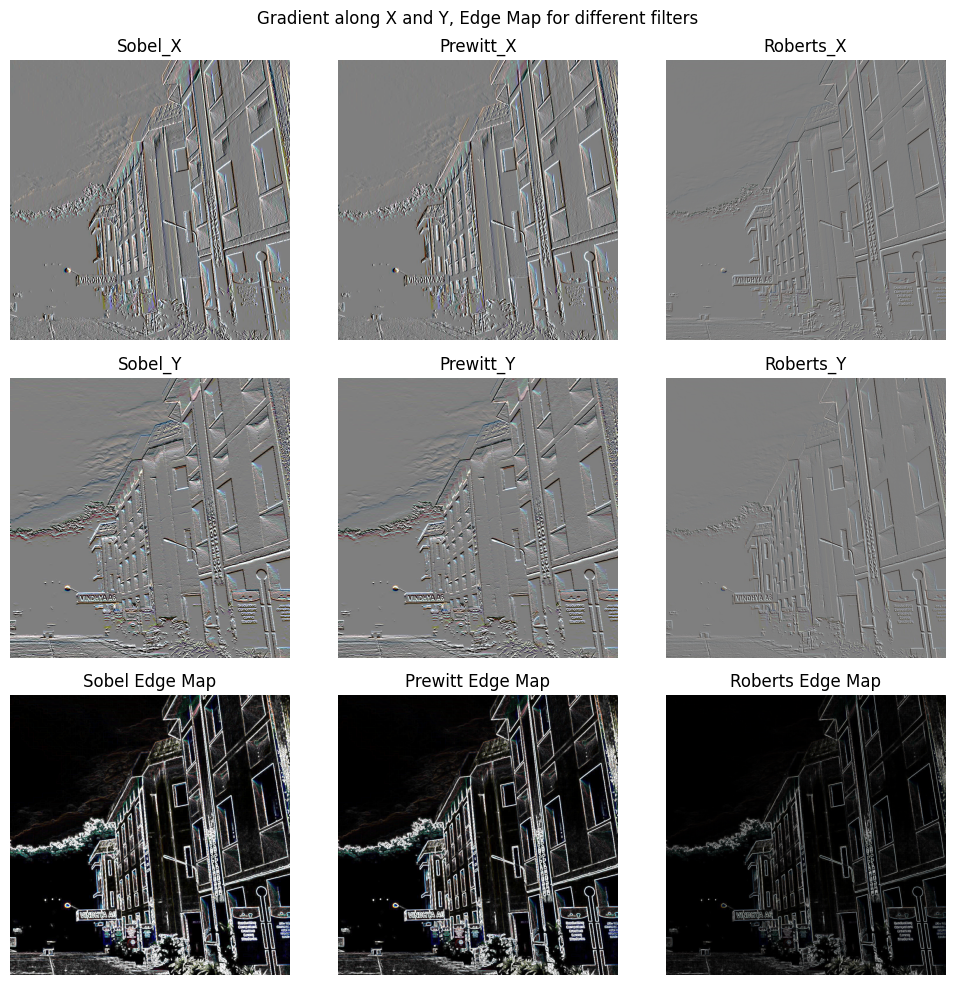

In [22]:
img3 = read_image(f'{IMAGES_DIR}/IMG3.jpeg')

img3_sobel, img3_sobel_X, img3_sobel_Y = sobelFilter(img3)
assert img3.shape == img3_sobel.shape == img3_sobel_X.shape == img3_sobel_Y.shape

img3_prewitt, img3_prewitt_X, img3_prewitt_Y = prewittFilter(img3)
assert img3.shape == img3_prewitt.shape == img3_prewitt_X.shape == img3_prewitt_Y.shape

img3_roberts, img3_roberts_X, img3_roberts_Y = robertsFilter(img3)
assert img3.shape == img3_roberts.shape == img3_roberts_X.shape == img3_roberts_Y.shape

fig, axs = plt.subplots(3, 3, figsize=(10, 10))
fig.suptitle('Gradient along X and Y, Edge Map for different filters')

display_image(img3_sobel_X, 'Sobel_X', axs[0][0])
display_image(img3_prewitt_X, 'Prewitt_X', axs[0][1])
display_image(img3_roberts_X, 'Roberts_X', axs[0][2])

display_image(img3_sobel_Y, 'Sobel_Y', axs[1][0])
display_image(img3_prewitt_Y, 'Prewitt_Y', axs[1][1])
display_image(img3_roberts_Y, 'Roberts_Y', axs[1][2])

display_image(img3_sobel, 'Sobel Edge Map', axs[2][0])
display_image(img3_prewitt, 'Prewitt Edge Map', axs[2][1])
display_image(img3_roberts, 'Roberts Edge Map', axs[2][2])

plt.tight_layout()
save_plot(f'{PLOTS_DIR}/egde_map_comparision.png')

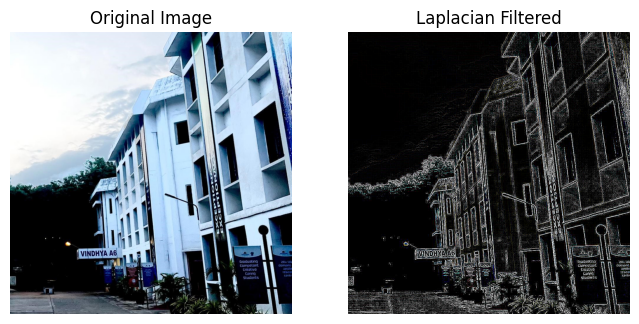

In [23]:
def laplacianFilter(img: npt.NDArray[np.uint8], k: int = 5) -> npt.NDArray[np.uint8]:
    """ Applies the Laplacian Filter to a 2D image. """

    # Validate argument
    assert k % 2 != 0, f'Expected odd value for k, got {k}'

    # Laplacian Filter
    L = np.zeros((k, k))
    kdx_max = math.floor(k / 2)
    for kdx in range(kdx_max):
        for idx in range(kdx, k - kdx):
            if (idx < math.ceil(k / 2)):
                L[idx, kdx_max - idx + kdx] = -(2 ** kdx)
                L[idx, kdx_max + idx - kdx] = -(2 ** kdx)
            else:
                L[idx, kdx_max + idx + kdx - k + 1] = -(2 ** kdx)
                L[idx, kdx_max + k - 1 - idx - kdx] = -(2 ** kdx)
    L[kdx_max, kdx_max] = - np.sum(L)
    assert np.isclose(np.sum(L), 0)

    # Compute the laplacian
    out = conv2D(img.astype(np.int32), L)

    # Cast back to unsigned int
    out = np.clip(out, 0, 255).astype(np.uint8)

    return out

img3 = read_image(f'{IMAGES_DIR}/IMG3.jpeg')
img3_filtered = laplacianFilter(img3)
assert img3.shape == img3_filtered.shape
write_image(f'{OUTPUT_DIR}/IMG3_laplacian.png', img3_filtered)

fig, axs = plt.subplots(1, 2, figsize=(8, 4))
display_image(img3, 'Original Image', axs[0])
display_image(img3_filtered, 'Laplacian Filtered', axs[1])
save_plot(f'{PLOTS_DIR}/laplacianFilter.png')

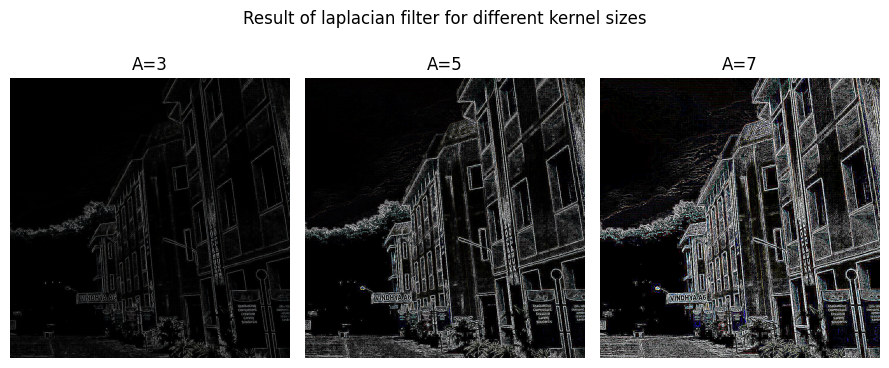

In [24]:
# Read the image
img3 = read_image(f'{IMAGES_DIR}/IMG3.jpeg')

# Test cases
list_k = [3, 5, 7]

# Filtered images for each test case
filtered_images = []

# Iterate over test cases
for k in list_k:
    img3_filtered = laplacianFilter(img3, k=k)
    # write_image(f'{OUTPUT_DIR}/IMG3_laplacian_{k}.png', img3_filtered)
    filtered_images.append(img3_filtered)

# Plot the images
fig, axs = plt.subplots(1, len(list_k), figsize=(9, 4))
fig.suptitle('Result of laplacian filter for different kernel sizes')
for idx, A in enumerate(list_k):
    display_image(filtered_images[idx], f'A={list_k[idx]}', axs[idx])
plt.tight_layout()

save_plot(f'{PLOTS_DIR}/laplacianFilter_kernel_size.png')

**Observations:**

- The Sobel X and Y filters, assign a higher importance to the nearby (i.e. horizontally/vertically adjacent) neighbour, incorporating the effect of weighted integration. As a result, it tends to preserve thinner and/or inclined edges that may not supported by the axis parallel neighbours.

- The Prewitt X and Y filters, on the other hand, do a simple uniform averaging over all the individual partial derivatives. As a result, it tends to create relatively lighter edges.

- The Roberts Cross operators look for diagonal edges. It thus produces the neatest results, for the provided test sample with inclined edges.

- The Laplacian filter, modeled on the Laplacian operator, identifies pixels that act as a "source". This unfortunately means changes that are not of interest to us (eg. noise) may also be highlighted.

### 4. Sharpen Up

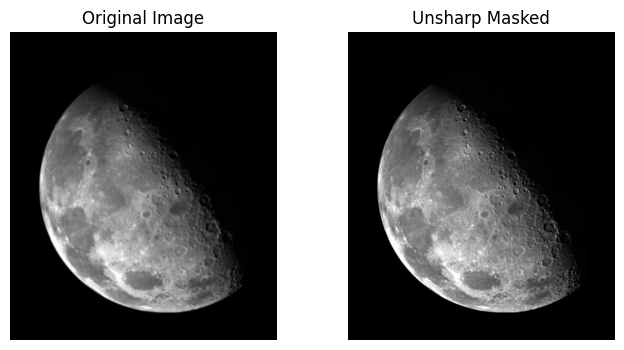

In [25]:
def unsharpMask(img: npt.NDArray[np.uint8], k: int = 7, sigma: float = 1.0) -> npt.NDArray[np.uint8]:
    """ Applies Unsharp Masking to a 2D image using a kernel of size k and standard deviation sigma. """

    # Compute the mask
    img_blurred = gaussFilter(img, k, sigma)
    mask = img.astype(np.int32) - img_blurred.astype(np.int32)

    # Add the mask to the image
    out = img.astype(np.int32) + mask

    # Restrict output to (0, 255) range
    out = np.clip(out, 0, 255).astype(np.uint8)

    return out

img4 = read_image(f'{IMAGES_DIR}/IMG4.png')
img4_filtered = unsharpMask(img4)
assert img4.shape == img4_filtered.shape
write_image(f'{OUTPUT_DIR}/IMG4_unsharp.png', img4_filtered)

fig, axs = plt.subplots(1, 2, figsize=(8, 4))
display_image(img4, 'Original Image', axs[0])
display_image(img4_filtered, 'Unsharp Masked', axs[1])
save_plot(f'{PLOTS_DIR}/unsharpMask.png')

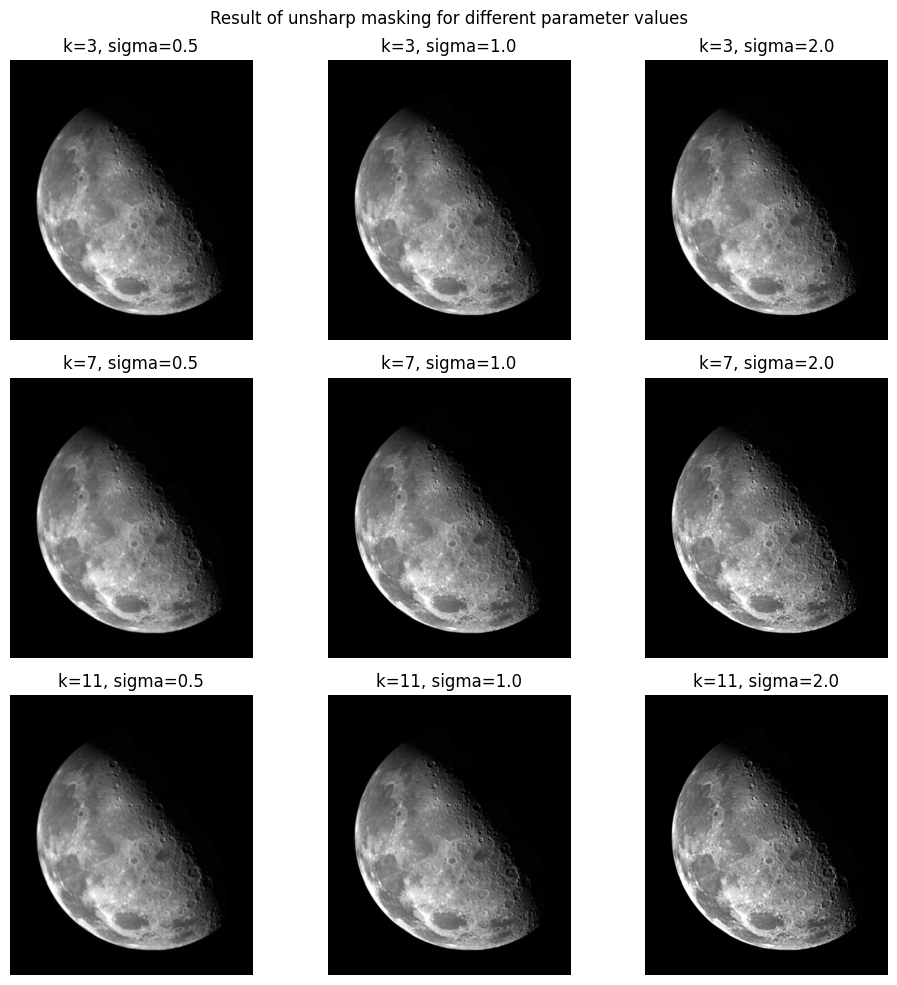

In [26]:
# Read the image
img4 = read_image(f'{IMAGES_DIR}/IMG4.png')

# Test cases
list_k = [3, 7, 11]
list_sigma = [0.5, 1.0, 2.0]

# Filtered images for each test case
unsharp_images = [ [] for _ in list_k ]

# Iterate over test cases
for idx, k in enumerate(list_k):
    for sigma in list_sigma:
        img4_filtered = unsharpMask(img4, k=k, sigma=sigma)
        # write_image(f'{OUTPUT_DIR}/IMG4_unsharp_{k}_{sigma}.png', img4_filtered)
        unsharp_images[idx].append(img4_filtered)

# Plot the images
fig, axs = plt.subplots(len(list_k), len(list_sigma), figsize=(10, 10))
fig.suptitle('Result of unsharp masking for different parameter values')
for idx, k in enumerate(list_k):
    for jdx, sigma in enumerate(list_sigma):
        display_image(unsharp_images[idx][jdx], f'k={list_k[idx]}, sigma={list_sigma[jdx]}', axs[idx][jdx])
plt.tight_layout()

save_plot(f'{PLOTS_DIR}/unsharpMask_parameter_variation.png')

**Observations:**

- Inline with our observations on gaussian filtering, increase in k and standard deviation results in more blurring, and consequently richer detail mask. Addition of this mask results in more sharpened image.

- Likewise, we can also expect the effect of increasing standard deviation to saturate beyond the "optimal" value.

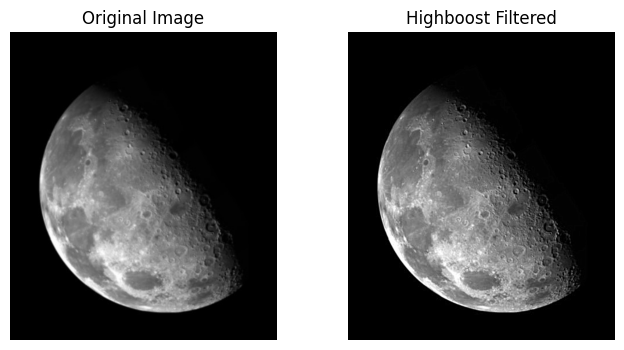

In [27]:
def highboostFilter(
    img: npt.NDArray[np.uint8], k: int = 7, sigma: float = 1.0, A: float = 2.0
)-> npt.NDArray[np.uint8]:
    """ Applies Highboost Filtering to a 2D image using a kernel of size k,
    standard deviation sigma and a boost factor A. """

    # Compute the mask
    img_blurred = gaussFilter(img, k, sigma)
    mask = img.astype(np.int32) - img_blurred.astype(np.int32)

    # Add the mask to the image
    out = img.astype(np.int32) + A * mask

    # Restrict output to (0, 255) range
    out = np.clip(out, 0, 255).astype(np.uint8)

    return out

img4 = read_image(f'{IMAGES_DIR}/IMG4.png')
img4_filtered = highboostFilter(img4)
assert img4.shape == img4_filtered.shape
write_image(f'{OUTPUT_DIR}/IMG4_highboost.png', img4_filtered)

fig, axs = plt.subplots(1, 2, figsize=(8, 4))
display_image(img4, 'Original Image', axs[0])
display_image(img4_filtered, 'Highboost Filtered', axs[1])
save_plot(f'{PLOTS_DIR}/highboostFilter.png')

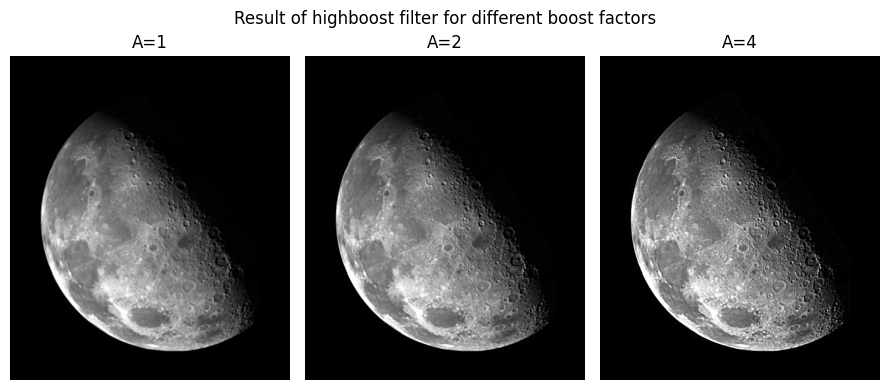

In [28]:
# Read the image
img4 = read_image(f'{IMAGES_DIR}/IMG4.png')

# Test cases
list_A = [1, 2, 4]

# Filtered images for each test case
highboost_images = []

# Iterate over test cases
for A in list_A:
    img4_filtered = highboostFilter(img4, A=A)
    # write_image(f'{OUTPUT_DIR}/IMG4_highboost_{A}.png', img4_filtered)
    highboost_images.append(img4_filtered)

# Plot the images
fig, axs = plt.subplots(1, len(list_A), figsize=(9, 4))
fig.suptitle('Result of highboost filter for different boost factors')
for idx, A in enumerate(list_A):
    display_image(highboost_images[idx], f'A={list_A[idx]}', axs[idx])
plt.tight_layout()

save_plot(f'{PLOTS_DIR}/highboostFilter_boost_factor.png')

**Observations:**

- Increase in the boost factor, gives way to more importance given to the detail mask, resulting in more evident details.

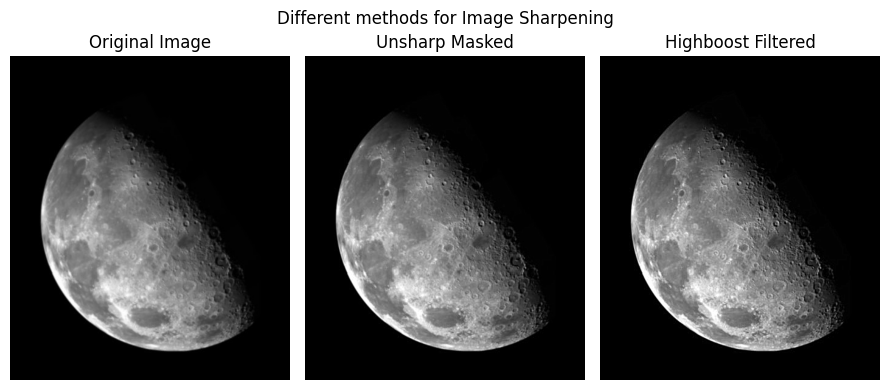

In [29]:
img4 = read_image(f'{IMAGES_DIR}/IMG4.png')
img4_unsharp = unsharpMask(img4)
img4_highboost = highboostFilter(img4)
assert img4.shape == img4_unsharp.shape == img4_highboost.shape

fig, axs = plt.subplots(1, 3, figsize=(9, 4))
fig.suptitle('Different methods for Image Sharpening')

display_image(img4, 'Original Image', axs[0])
display_image(img4_unsharp, 'Unsharp Masked', axs[1])
display_image(img4_highboost, 'Highboost Filtered', axs[2])

plt.tight_layout()
save_plot(f'{PLOTS_DIR}/image_sharpening_comparision.png')

**Observations:**

- Unsharp Mask can be viewed as a special mask of Highboost Filtering, when the boost factor equals one.

- The observation concerning boost factor follows. Highboost Filtering results in a sharper image than Unsharp Mask, enhancing fine details.

### 5. Rain Rain Go Away!

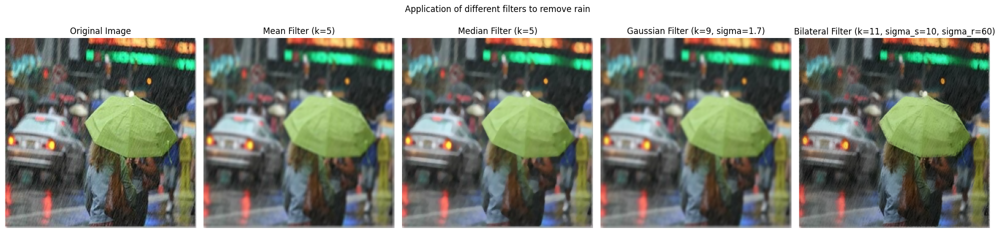

In [30]:
img5 = read_image(f'{IMAGES_DIR}/IMG5.jpg')
img5_mean_filtered = fastMeanFilter(img5)
img5_median_filtered = medianFilter(img5)
img5_gaussian_filtered = gaussFilter(img5, k=9, sigma=1.7)
img5_bilateral_filtered = bilateralFilter(img5, k=11, sigma_range=60)
assert img5.shape == img5_mean_filtered.shape == img5_median_filtered.shape == \
                                    img5_gaussian_filtered.shape == img5_bilateral_filtered.shape

write_image(f'{OUTPUT_DIR}/IMG5_mean.png', img5_mean_filtered)
write_image(f'{OUTPUT_DIR}/IMG5_median.png', img5_median_filtered)
write_image(f'{OUTPUT_DIR}/IMG5_gaussian.png', img5_gaussian_filtered)
write_image(f'{OUTPUT_DIR}/IMG5_bilateral.png', img5_bilateral_filtered)

fig, axs = plt.subplots(1, 5, figsize=(20, 5))
fig.suptitle('Application of different filters to remove rain')

display_image(img5, 'Original Image', axs[0])
display_image(img5_mean_filtered, 'Mean Filter (k=5)', axs[1])
display_image(img5_median_filtered, 'Median Filter (k=5)', axs[2])
display_image(img5_gaussian_filtered, 'Gaussian Filter (k=9, sigma=1.7)', axs[3])
display_image(img5_bilateral_filtered, 'Bilateral Filter (k=11, sigma_s=10, sigma_r=60)', axs[4])

plt.tight_layout()
save_plot(f'{PLOTS_DIR}/rain_removal.png')

**Observations:**

- The mean filter and median filter, work well for the default parameter value k = 5, beyond which the loss of blurring overweighs the benefit of removing rain.

- The median filter, however, preserves the details better (e.g. that of the umbrella and the car), as it is less susceptible to outliers.

- The gaussian filter gives similar results to that of mean filter. Both make use of blurring to remove rain, except that the effect of blur grows slowly in the gaussian filter.

- The bilateral filter fails to remove rain entirely, due to its nature of preserving change in intensities. It however manages to bring out the details in the objects successfully, which otherwise was not very obvious due to rain. The effect of rain is restricted to sharp lines of rain running across the image, which presumably could be removed by applying a notch filter.

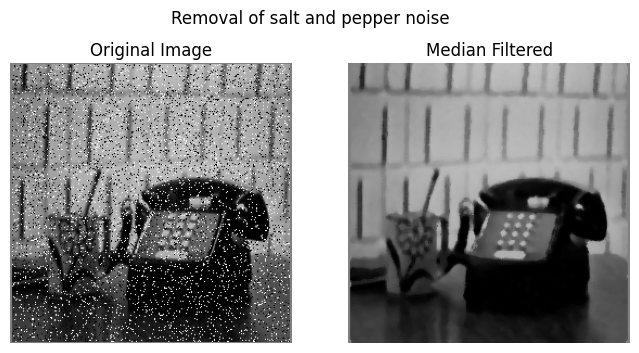

In [31]:
img6 = read_image(f'{IMAGES_DIR}/IMG6.png')
img6_filtered = medianFilter(img6)
assert img6.shape == img6_filtered.shape
write_image(f'{OUTPUT_DIR}/IMG6_median.png', img6_filtered)

fig, axs = plt.subplots(1, 2, figsize=(8, 4))
fig.suptitle('Removal of salt and pepper noise')
display_image(img6, 'Original Image', axs[0])
display_image(img6_filtered, 'Median Filtered', axs[1])
save_plot(f'{PLOTS_DIR}/noise_removal.png')

**Observations:**

- The noise present is called salt and pepper noise, which contains pixels randomly colored black or white.

- The choice of interest for removal of salt and pepper noise is median filtering, as it tends to avoid outlier values, unlike mean filter (or any simple summation based filter) that is vulnerable to it.

### 6. Transform and Conquer

In [32]:
def binary_thresholding(img: npt.NDArray[np.uint8], alpha: int = 128) -> npt.NDArray[np.uint8]:
    """ Converts a 2D grayscale image to a binary image. """

    out = img.copy()
    out[out >= alpha] = 255
    out[out  < alpha] = 0
    return out

def invert_binary_image(img: npt.NDArray[np.uint8]) -> npt.NDArray[np.uint8]:
    """ Inverts a binary image. """

    mask = img == 255
    out = img.copy()
    out[mask] = 0
    out[~mask] = 255
    return out

def boolean_to_binary_image(boolean_array: npt.NDArray[bool]) -> npt.NDArray[np.uint8]:
    """ Converts a boolean array to a binary image. """

    out = np.zeros(boolean_array.shape, dtype=np.uint8)
    out[boolean_array] = 255
    return out

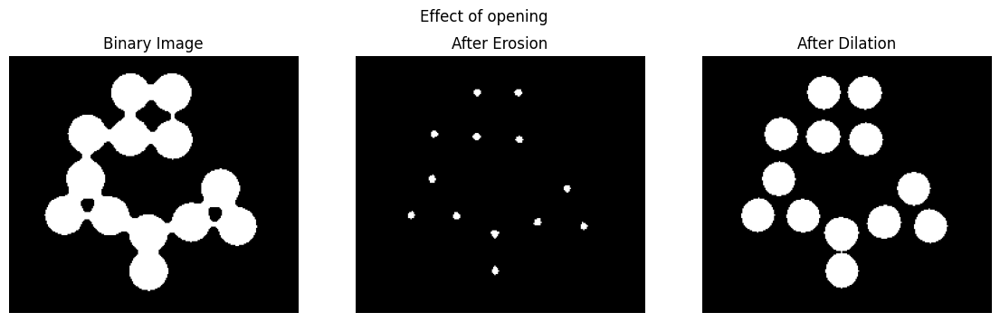

In [33]:
def structuring_element_disk(k: int):
    """ Generates a disk shaped structuring element of size k x k. """

    # Generate the indices for the given size
    u_min = -math.ceil((k - 1) / 2)
    u_max = math.floor((k - 1) / 2)
    x, y = np.mgrid[u_min:u_max+1, u_min:u_max+1]

    # Compute the structuring element
    se = np.sqrt(x**2 + y**2)
    mask = se <= k // 2
    se[mask] = 255
    se[~mask] = 0
    se = np.clip(se, 0, 255).astype(np.uint8)

    return se

def dilate(img: npt.NDArray[np.uint8], se: npt.NDArray[np.uint8]) -> npt.NDArray[np.uint8]:
    """ Applies Dilation to a 2D image using a 2D structuring element. """

    # Image and structuring element dimensions
    i_h, i_w = img.shape[:2]
    k_h, k_w = se.shape
    output = np.empty_like(img)

    # Flip the structuring element
    se = np.flipud(np.fliplr(se))

    # Number of values padded to the edges of each axis
    p0 = (math.ceil((k_h - 1) / 2), math.floor((k_h - 1) / 2))
    p1 = (math.ceil((k_w - 1) / 2), math.floor((k_w - 1) / 2))
    p2 = (0, 0)

    # Apply padding to the image
    assert img.ndim == 2, 'Expected a binary image for morphological operation'
    img = np.pad(img, (p0, p1), mode='reflect')

    # Move the structuring element across the image
    for idx in range(i_h):
        for jdx in range(i_w):
            if np.logical_and(img[idx:idx+k_h, jdx:jdx+k_w] == se, se != 0).any():
                output[idx, jdx] = 255
            else:
                output[idx, jdx] = 0

    return output

def erode(img: npt.NDArray[np.uint8], se: npt.NDArray[np.uint8]) -> npt.NDArray[np.uint8]:
    """ Applies Erosion to a 2D image using a 2D structuring element. """

    # Image and structuring element dimensions
    i_h, i_w = img.shape[:2]
    k_h, k_w = se.shape
    output = np.empty_like(img)

    # Number of values padded to the edges of each axis
    p0 = (math.ceil((k_h - 1) / 2), math.floor((k_h - 1) / 2))
    p1 = (math.ceil((k_w - 1) / 2), math.floor((k_w - 1) / 2))
    p2 = (0, 0)

    # Apply padding to the image
    assert img.ndim == 2, 'Expected a binary image for morphological operation'
    img = np.pad(img, (p0, p1), mode='reflect')

    # Move the structuring element across the image
    for idx in range(i_h):
        for jdx in range(i_w):
            if np.logical_or(img[idx:idx+k_h, jdx:jdx+k_w] == se, se == 0).all():
                output[idx, jdx] = 255
            else:
                output[idx, jdx] = 0

    return output

fig, axs = plt.subplots(1, 3, figsize=(14, 4))
fig.suptitle('Effect of opening')

img7 = read_image(f'{IMAGES_DIR}/IMG7.jpg', color_space='gray')
img7_binary = binary_thresholding(img7)
display_image(img7_binary, 'Binary Image', axs[0])

se = structuring_element_disk(27)
img7_eroded = erode(img7_binary, se)
display_image(img7_eroded, 'After Erosion', axs[1])

se = structuring_element_disk(23)
img7_dilated = dilate(img7_eroded, se)
display_image(img7_dilated, 'After Dilation', axs[2])

write_image(f'{OUTPUT_DIR}/IMG7_opening.png', img7_dilated)
save_plot(f'{PLOTS_DIR}/opening.png')

**Observations:**

- We first erode the image with a disk structural element to separate the overlapping coins. This however results in the size of the coins being shrinked.

- To restore the coins back to their original size, we dilate the image with a disk structural element of slightly smaller size, to avoid the coins overlapping again.

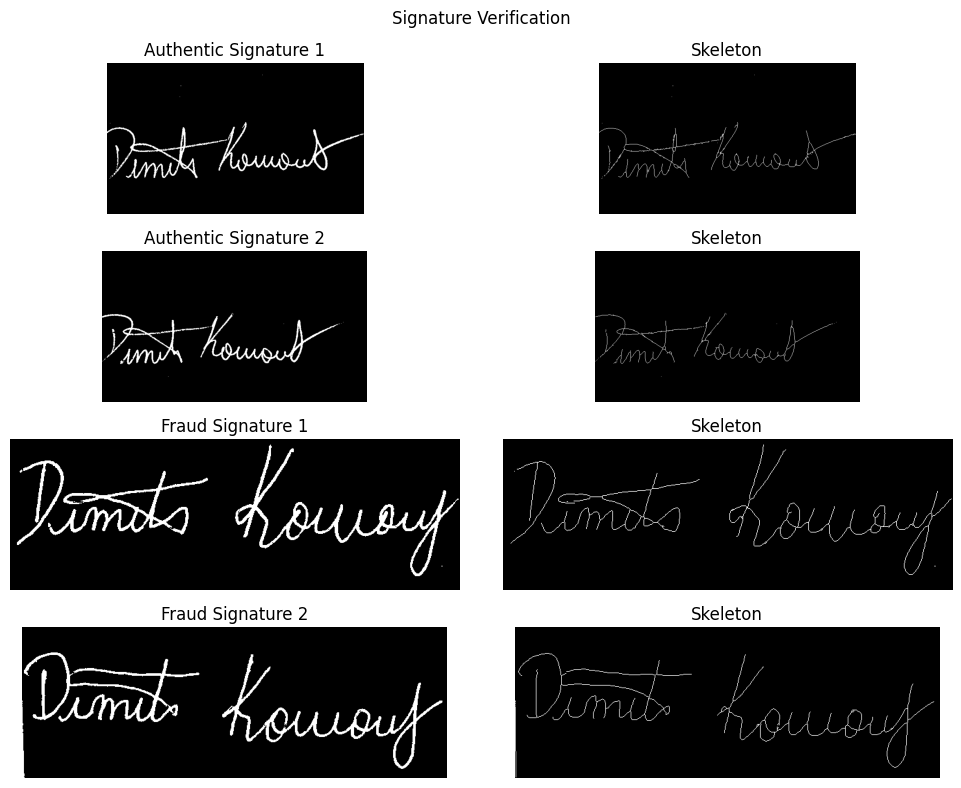

In [34]:
fig, axs = plt.subplots(4, 2, figsize=(10, 8))
fig.suptitle('Signature Verification')

original_1 = read_image(f'{IMAGES_DIR}/original_13_1.png', color_space='gray')
original_1 = binary_thresholding(original_1, alpha=200)
original_1 = invert_binary_image(original_1)
original_1_skeleton = boolean_to_binary_image(skeletonize(original_1))
display_image(original_1, 'Authentic Signature 1', axs[0][0])
display_image(original_1_skeleton, 'Skeleton', axs[0][1])
write_image(f'{OUTPUT_DIR}/original_13_1_skeleton.png', original_1_skeleton)

original_2 = read_image(f'{IMAGES_DIR}/original_13_2.png', color_space='gray')
original_2 = binary_thresholding(original_2, alpha=200)
original_2 = invert_binary_image(original_2)
original_2_skeleton = boolean_to_binary_image(skeletonize(original_2))
display_image(original_2, 'Authentic Signature 2', axs[1][0])
display_image(original_2_skeleton, 'Skeleton', axs[1][1])
write_image(f'{OUTPUT_DIR}/original_13_2_skeleton.png', original_2_skeleton)

forgeries_1 = read_image(f'{IMAGES_DIR}/forgeries_13_1.png', color_space='gray')
forgeries_1 = binary_thresholding(forgeries_1, alpha=200)
forgeries_1 = invert_binary_image(forgeries_1)
forgeries_1_skeleton = boolean_to_binary_image(skeletonize(forgeries_1))
display_image(forgeries_1, 'Fraud Signature 1', axs[2][0])
display_image(forgeries_1_skeleton, 'Skeleton', axs[2][1])
write_image(f'{OUTPUT_DIR}/forgeries_13_1_skeleton.png', forgeries_1_skeleton)

forgeries_2 = read_image(f'{IMAGES_DIR}/forgeries_13_2.png', color_space='gray')
forgeries_2 = binary_thresholding(forgeries_2, alpha=200)
forgeries_2 = invert_binary_image(forgeries_2)
forgeries_2_skeleton = boolean_to_binary_image(skeletonize(forgeries_2))
display_image(forgeries_2, 'Fraud Signature 2', axs[3][0])
display_image(forgeries_2_skeleton, 'Skeleton', axs[3][1])
write_image(f'{OUTPUT_DIR}/forgeries_13_2_skeleton.png', forgeries_2_skeleton)

plt.tight_layout()
save_plot(f'{PLOTS_DIR}/skeletonize.png')

**Observations:**

- The computed skeletons look stable for the samples tested.

- This however relied on the use of binary thresholding, which is subject to the value of threshold. The same value of threshold is not guaranteed to work across datasets.

- To make this more robust, we can incorporate median filtering, to filter out irrelevant details (such as those of the writing surface).

- Regarding fraud detection, the skeletons help capture the essence of handwriting. It has advantage over simple handwritten text which comes with less relevant features like width of ink stroke. As one could notice, the shape of the alphabets clearly differ largely in fraud signatures, than they do over the genuine ones.

### 7. Body Scan Enhancement

In [35]:
def power_law_transformation(img: npt.NDArray[np.uint8], gamma: float, c: float = 1.0) -> npt.NDArray[np.uint8]:
    """ Applies Power Law transformation to a 2D image, for a given gamma and an optional scaling factor. """

    out = c * (img.astype(np.float64) ** gamma)
    out = np.clip(np.rint(out), 0, 255).astype(np.uint8)
    return out

def increase_contrast(img: npt.NDArray[np.uint8], threshold: float = 1.5) -> npt.NDArray[np.uint8]:
    """ Increases the contrast of an image, by remapping intensities to span the (0, 255) range. """

    output = img.copy().astype(np.float64)
    min_value = np.percentile(output, threshold)
    max_value = np.percentile(output, 100 - threshold)
    output = output - min_value
    output = output * 255 / (max_value - min_value)

    output = np.round(output)
    output = np.clip(output, 0, 255)
    output = output.astype(np.uint8)
    return output

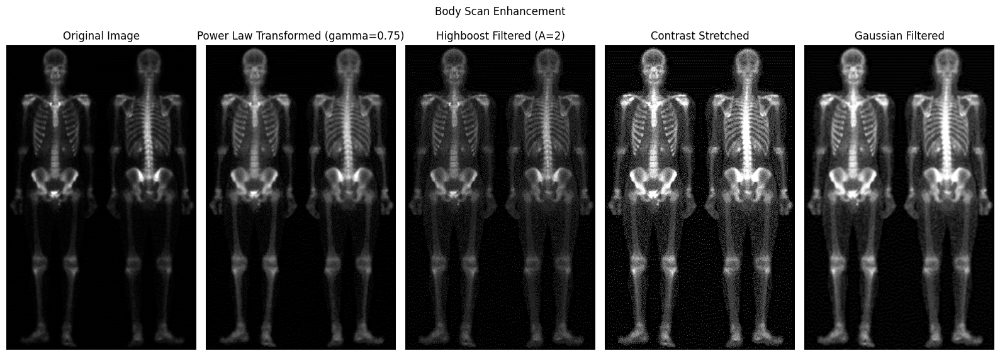

In [36]:
fig, axs = plt.subplots(1, 5, figsize=(16, 6))
fig.suptitle('Body Scan Enhancement')

img8 = read_image(f'{IMAGES_DIR}/IMG8.png', color_space='gray')
display_image(img8, 'Original Image', axs[0])

img8_gamma_corrected = power_law_transformation(img8, 0.75)
display_image(img8_gamma_corrected, 'Power Law Transformed (gamma=0.75)', axs[1])

img8_highboost_filtered = highboostFilter(img8_gamma_corrected)
display_image(img8_highboost_filtered, 'Highboost Filtered (A=2)', axs[2])

img8_contrast_increased = increase_contrast(img8_highboost_filtered)
display_image(img8_contrast_increased, 'Contrast Stretched', axs[3])

img8_gaussian_filtered = gaussFilter(img8_contrast_increased)
display_image(img8_gaussian_filtered, 'Gaussian Filtered', axs[4])

write_image(f'{OUTPUT_DIR}/IMG8_enhanced.png', img8_gaussian_filtered)

plt.tight_layout()
save_plot(f'{PLOTS_DIR}/body_scan_enhancement.png')

**Observations:**

- We first apply the power law transformation with gamma < 1, to enhance the visibility of small intensity changes.

- We then apply highboost filtering to enhance the visibility of boundaries.

- Lastly, we use contrast stretching (to aid comprehension) and gaussian filter (to smoothen out noise) for final touchup.

### 8. You Can't See Me

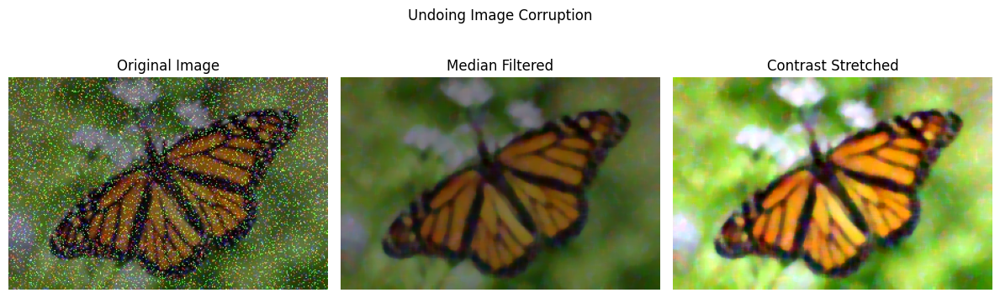

In [37]:
fig, axs = plt.subplots(1, 3, figsize=(12, 4))
fig.suptitle('Undoing Image Corruption')

img9 = read_image(f'{IMAGES_DIR}/IMG9.jpg')
display_image(img9, 'Original Image', axs[0])

img9_median_filtered = medianFilter(img9, k=7)
display_image(img9_median_filtered, 'Median Filtered', axs[1])

img9_contrast_increased = increase_contrast(img9_median_filtered)
display_image(img9_contrast_increased, 'Contrast Stretched', axs[2])

write_image(f'{OUTPUT_DIR}/IMG9_enhanced.png', img9_contrast_increased)

plt.tight_layout()
save_plot(f'{PLOTS_DIR}/corrupted_image.png')

**Observations:**

- We first apply median filtering to remove the sprinkled noise, similar to that of the telephone image.

- We then apply contrast stretching to aid image comprehension.